In [ ]:
!unzip -qq nevus.zip
!rm nevus.zip
!rm -rf __MACOSX

unzip:  cannot find or open nevus.zip, nevus.zip.zip or nevus.zip.ZIP.
rm: cannot remove 'nevus.zip': No such file or directory


In [ ]:
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from sklearn.utils import shuffle
from scipy import signal
from skimage import segmentation
from skimage.filters import threshold_otsu
from skimage import color


from skimage import data
from skimage.morphology import disk, binary_dilation
from skimage.restoration import inpaint
import glob
import cv2
import os
from scipy.signal import convolve2d
from scipy.ndimage.filters import gaussian_filter,median_filter
#from skimage input_color
from skimage.feature import peak_local_max
import matplotlib

## Image loading

In [ ]:
# !unzip -qq nevus.tar
# !rm nevus.tar
# !rm -rf __MACOSX
!ls
!tar -xvf nevus2.tar

nevus  nevus2.tar  sample_data
nevus/
nevus/ISIC_0000095.jpg
nevus/ISIC_0000042_Segmentation.png
nevus/ISIC_0000024.jpg
nevus/ISIC_0000024_Segmentation.png
nevus/ISIC_0000001.jpg
nevus/ISIC_0000001_Segmentation.png
nevus/ISIC_0000080.jpg
nevus/ISIC_0000008.jpg
nevus/ISIC_0000000.jpg
nevus/ISIC_0000042.jpg
nevus/ISIC_0000095_Segmentation.png
nevus/ISIC_0000000_Segmentation.png
nevus/ISIC_0000112_Segmentation.png
nevus/ISIC_0000045_Segmentation.png
nevus/ISIC_0000045.jpg
nevus/ISIC_0000019.jpg
nevus/ISIC_0000008_Segmentation.png
nevus/ISIC_0000080_Segmentation.png
nevus/ISIC_0000019_Segmentation.png
nevus/ISIC_0000112.jpg
nevus/README


# Hair Removal methods

## Removing hair with Sequential filtering

In [ ]:
def sequential_filter(img, steps):
    img_c = color.rgb2gray(img.copy())
    for ii in range(steps):
        strell = morpho.disk(ii)
        img_c = morpho.dilation(img_c,strell)
        plt.figure(figsize = (5,5))
        plt.imshow(img_c,cmap = "gray")
        plt.show()
    return ()

##Hair removal by inpainting as reference

In this part, we see the hairs as obsracles and we will try to remove the hairs in the image by the inpainting method, the same method as removal of people before spring that we see in the class.

*   We first calculate the binarilized morpholigy gradient as the mask for the inpainting task, which indicates the location of the hairs that we want to remove.
*   Then we expand the dimentions of the masks to make it work for RGB images.
*   As the inpainting algorithme is very time consuming, so we save our output inpainted results in the google drive (or the local disk) to make the process after more efficient. You can just run the function below for once and reload the inpainted images according to their location for the segmentation tasks.


In [ ]:
# dataloader only for the inpainting part
def data_loader(file_path):
  img_list = []
  mask_list = []
  img_path_list = []
  mask_path_list = []

  for img_path in sorted(glob.glob(file_path + "/*.jpg")):
    print(img_path)
    img_path_list.append(img_path)
    img = skio.imread(img_path)
    img_list.append(img)

  for img_path in sorted(glob.glob(file_path + "/*.png")):
    print(img_path)
    mask_path_list.append(img_path)
    img = skio.imread(img_path)
    mask_list.append(img)


  return img_list, mask_list,img_path_list,mask_path_list

We calculate the binary morphology gradient as the mask

In [ ]:
def calculated_morphogradient(image_defect): #img

  gray = cv2.cvtColor(image_defect, cv2.COLOR_RGB2GRAY)
  erosion = morpho.erosion(gray, morpho.disk(6))
  dilation = morpho.dilation(gray, morpho.disk(9))
  gradient = dilation - erosion
  closing = morpho.closing(gray, morpho.disk(20))
  tophat = gray - dilation


  bianry_gradient = (gradient > 20).astype(int)
  print(image_defect.shape)

  bianry_gradient_newdim = np.expand_dims(bianry_gradient,axis=2).repeat(3,axis=2)

  print(bianry_gradient_newdim.shape)

  fig, axes = plt.subplots(ncols=1, nrows=1)

  axes.set_title('binary gradient image')
  axes.imshow(bianry_gradient)

  return bianry_gradient_newdim

In [ ]:
def skimage_inpainting(image_defect,image_path): #img,i

  bianry_gradient_newdim = calculated_morphogradient(image_defect)
  image_result = inpaint.inpaint_biharmonic(image_defect, bianry_gradient_newdim)

  save_path = image_path.replace("nevus", "nevus_inpainting/") #+ image_path.split("\\")[-1].split(".")[0]
  if not os.path.exists(save_path):
    os.makedirs(save_path)

  #cv2.imwrite(save_path, image_result*255)
  save_path_full = save_path + image_path.split("/")[-1]
  skimage.io.imsave( save_path_full, image_result*255)
  print("saved img:"+save_path_full)

  fig, axes = plt.subplots(ncols=1, nrows=2,figsize=(240, 200))

  axes.set_title('impainting result')
  axes.imshow(image_result, cmap=plt.cm.gray)


  fig.tight_layout()
  axes.show()

  return save_path

Run the function below with the original_image_path = path to the original images, the function will create the inpinted ones in the new directory.

In [ ]:
def impainting_main(original_image_path):
  img_list, mask_list,img_path_list,mask_path_list = data_loader(original_image_path)
  for N in range(len(img_list)):
    image_defect = img_list[N]
    image_path = img_path_list[N]
    save_path = skimage_inpainting(image_defect,image_path)
  return save_path

##Hair removal by lowpass filters

In [ ]:
def filter_method(img):
  #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  gaussian_filtered_5 = gaussian_filter(img, sigma=3)
  gaussian_filtered_10 = gaussian_filter(img, sigma=5)
  gaussian_filtered_20 = gaussian_filter(img, sigma=9)

  gaussian_list = [gaussian_filtered_5,gaussian_filtered_10,gaussian_filtered_20]

  median_filtered_5 = median_filter(img, size=3)
  median_filtered_10 = median_filter(img, size=5)
  median_filtered_20 = median_filter(img, size=9)

  median_filtered_list = [median_filtered_5,median_filtered_10,median_filtered_20]

  size_list = [3,5,9]

  for i in range(len(gaussian_list)):
    fig, axs = plt.subplots(1, 2, figsize=(15,15))
    axs[0].imshow(gaussian_list[i])
    axs[0].set_title('gaussian filter with sigma = '+str(size_list[i]))

    axs[1].imshow(median_filtered_list[i])
    axs[1].set_title('median filter with size = '+str(size_list[i]))


    fig.tight_layout()
    plt.show()
  return()

In [ ]:
#filter_method(img)

##Hair removal by blackhat localization method
 This method aims to firstly localise the positions of the hair by using blackhat, and then put these pixels as white ( as the raison the hair will affect the segmentation process is it has the close color black with the dot to be segmented, so put the hair pixels as white will prevent from it be classified as dot when performing threshold operation ), and then performs opening operation to restore the center part.

In [ ]:
def straight_forward_method(image_defect): #img

  gray = cv2.cvtColor(image_defect, cv2.COLOR_RGB2GRAY)
  #erosion = morpho.erosion(gray, morpho.disk(6))
  #dilation = morpho.dilation(gray, morpho.disk(9))
  #gradient = dilation - erosion
  closing = morpho.closing(gray, morpho.disk(20))
  #tophat = gray - dilation
  blackhat = closing - gray


  #bianry_gradient = (gradient > 20).astype(int)
  #negativ = np.ones(hair_mask.shape) - hair_mask
  blackhat_binary = (blackhat > 20).astype(int)
  #tophat_binary = (tophat > 10).astype(int)
  #mask = negativ
  dilated_blackhat = morpho.dilation(blackhat_binary, morpho.disk(4))

  fig, axes = plt.subplots(ncols=2, nrows=2,figsize=(5,5))
  ax = axes.ravel()

  ax[0].set_title('gray image')
  ax[0].imshow(gray, cmap=plt.cm.gray)

  for i in range(gray.shape[0]):
    for j in range(gray.shape[1]):
      if dilated_blackhat[i][j]==1:
        gray[i][j] = 255

  ax[1].set_title('bianry_blackhat image')
  ax[1].imshow(dilated_blackhat, cmap=plt.cm.gray)

  ax[2].set_title('gray')
  ax[2].imshow(gray, cmap=plt.cm.gray)

  ax[3].set_title('gray opening')
  gray_opening = morpho.opening(gray,morpho.disk(45))
  ax[3].imshow(gray_opening, cmap=plt.cm.gray)

  plt.show()

  return gray_opening

## Hair removal and gradient

In [ ]:
def hair_removal_closing(strell_size, file_name):
 img = skio.imread(file_name)
 img = color.rgb2gray(img)
 print(img.shape)
 # we try a closing with a strell
 strell = morpho.disk(16)
 closing = morpho.closing(img, strell)
  # Computing the top-hat
 top_hat = closing - img
 top_hat = morpho.dilation(top_hat, morpho.disk(5))
 fig, ax = plt.subplots(2,2,figsize=(12,12))
 ax[0][0].imshow(img,cmap = "gray")
 ax[0][0].set_title("Original Image")
 ax[0][1].imshow(closing, cmap = "gray")
 ax[0][1].set_title("image after closing")
 ax[1][0].imshow(top_hat, cmap = "gray")
 ax[1][0].set_title("Top hat")
 return closing

 plt.show()


 def gradient(closing, structuring_size):
  # Gradient
  structuring = morpho.disk(structuring_size)
  morpho_grad = morpho.dilation(closing, structuring) - morpho.erosion(closing, structuring)
  modified_grad = morpho.opening(morpho_grad, morpho.disk(structuring_size+2))
  # gaussian_kernel = gaussuian_filter(5, 1, 0)
  # modified_grad = convolve2d(modified_grad, gaussian_kernel, mode = "valid")
  plt.imshow(modified_grad, cmap = "gray")
  return morpho_grad, modified_grad


 def water_shed(modified_grad, morpho_grad, k=None):
  # watershed algorithm
  # markers = peak_local_max(modified_grad, min_distance = 20)
  cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
  reconstructed_img = morpho.reconstruction(modified_grad, morpho_grad)
  segmented = morpho.watershed(reconstructed_img, k)
  plt.imshow(segmented, cmap = cmaprand)
  return segmented

def Comparison(segmented, ground_truth):
 # Comparison

#  file_name_seg = file_name[:18] + "_Segmentation.png"
#  ground_truth = skio.imread(file_name_seg)
 figure, axes = plt.subplots(1,2,figsize = (10,10))
 axes[0].set_title("ground truth")
 axes[0].imshow(ground_truth, cmap = "gray")
 axes[1].set_title("segmentation result")
 axes[1].imshow(segmented, cmap = "gray")
 plt.show()

In [ ]:

#for file_name in files:
 #hair_removal_closing(strell_size, file_name)
 #morpho_grad, modified_grad = gradient(structuring_size)
 #segmentation = water_shed(modified_grad, morpho_grad, k=None)



#Metrics

In [ ]:
from sklearn import metrics

def performance(y_true, y_pred, model):

    acc = metrics.accuracy_score(y_true, y_pred)
    con_mat = metrics.confusion_matrix(y_true, y_pred, labels=list(range(2)))
    print(f'{model}'.center(20, "="))
    print("accuracy:", acc)
    print("confusion matrix:")
    print(con_mat)

# Segmentation methods

## Segmentation with tresholding

### Mean treshold

In [ ]:
def tresholding(img):
  #for i in files:
    #img = skio.imread(i)
  gimg = skimage.color.rgb2gray(img)
  histogram = skimage.exposure.histogram(img.flatten(), 255)
  flat_image =  gimg.flatten()
  cdf,bins = skimage.exposure.cumulative_distribution(flat_image,255)
  cdf2 = cdf*256
  flat_new_image = np.interp(flat_image, bins, cdf2)
  new_image = flat_new_image.reshape(gimg.shape)
  histogram_new = skimage.exposure.histogram(new_image.flatten())
  #plt.bar(histogram[1],histogram[0], width = 1)
  #plt.show()
  bmask = new_image < 75

  strell = morpho.disk(1)
  recreate = morpho.binary_closing(bmask,strell)
  recreate2 = skimage.segmentation.clear_border(recreate)
  #fig,ax = plt.subplots(1,2,figsize = (10,10))
  #ax[0].imshow(img, cmap = "gray")
  #ax[0].set_title("original image")
  #ax[1].imshow(bmask, cmap = "gray")
  #ax[1].set_title("Mask")
  #plt.show()
  return(recreate2)

### Otsu's thresold

In [ ]:
def otsu_threshold(img):
 # for i in files:
    #img = skio.imread(i)
  gimg = skimage.color.rgb2gray(img)
  thresh = threshold_otsu(gimg)
  bmask = gimg < thresh

  bmask = segmentation.clear_border(bmask)
  strell = morpho.disk(1)
  recreate = morpho.binary_closing(bmask,strell)
  recreate2 = skimage.segmentation.clear_border(recreate)
  #fig,ax = plt.subplots(1,2,figsize = (10,10))
  #ax[0].imshow(img, cmap = "gray")
  #ax[0].set_title("original image")
  #ax[1].imshow(bmask, cmap = "gray")
  #ax[1].set_title("Mask")
  #plt.show()

  return(recreate2)

## Segmentation with k-means

In [ ]:
def recreate_image(codebook, labels, w, h):
      image = np.zeros((w, h))
      label_idx = 0
      for i in range(w):
          for j in range(h):
              image[i][j] = codebook[labels[label_idx]]
              label_idx += 1
      return image

def skmeans(img):
  #for i in files:
    #img = skio.imread(i)
  gimg = skimage.color.rgb2gray(img)
  img = np.array(gimg, dtype=np.float64)/256

  n_class = 2
  image_array = img.flatten()
  shuffled = shuffle(image_array)
  training_set = shuffled[0:500]
  kmeans = KMeans(n_class).fit(image_array.reshape(-1,1))
  labels = kmeans.predict(image_array.reshape(-1,1))

  strell = morpho.disk(1)
  recreate = recreate_image(kmeans.cluster_centers_, labels,w = img.shape[0],h = img.shape[1])
  recreate = recreate > recreate.min()
  recreate = np.multiply(np.add(recreate,-1),-1)
  recreate = morpho.binary_closing(recreate,strell)
  recreate2 = skimage.segmentation.clear_border(recreate)

  #plt.figure(1)
  #plt.clf()
  #plt.axis('off')
  #plt.title('Original image')
  #plt.imshow(img,cmap='gray')

  #plt.figure(2)
  #plt.clf()
  #plt.axis('off')
  #plt.title('Quantized image with KMeans')
  #plt.imshow(recreate2,cmap='gray')
  #plt.show()

  return recreate2, labels

## Segmentation using Bayesian classification

In [ ]:
from sklearn.mixture import GaussianMixture
from sklearn.utils import shuffle
import skimage.io as skio

def baysian_classification(img,n_class=2):
    w = img.shape[0]
    h = img.shape[1]
    image_array = img.reshape(img.shape[0]*img.shape[1],1)
    # fit the model on a randomly sampled subset of the image_array of 1000 points, using shuffle
    training_set = shuffle(image_array.copy(),n_samples=2000)
    GMM = GaussianMixture(n_components=n_class).fit(training_set)
    # predict the labels for all points
    labels_gmm = 1-GMM.predict(image_array)

    def recreate_image(codebook, labels, w, h):
        """Recreate the (compressed) image from the code book & labels"""
        image = np.zeros((w, h))
        label_idx = 0
        for i in range(w):
            for j in range(h):
                image[i][j] = codebook[labels[label_idx]]
                label_idx += 1
        return image
    img_seg = recreate_image(GMM.means_, labels_gmm, w, h)
    #strell = morpho.disk(1)
    #recreate = morpho.binary_closing(img_seg,strell)
    #recreate2 = skimage.segmentation.clear_border(recreate)
    # Display all results, alongside original image
    #fig, axs = plt.subplots(1, 2, figsize=(15,15))
    #axs[0].imshow(img, cmap='gray')
    #axs[0].set_title("original image")
    #axs[1].imshow(img_seg,cmap='gray')
    #axs[1].set_title("filtered image")
    return img_seg, labels_gmm

# Code for the generation of inpainting method

## Sequential filter


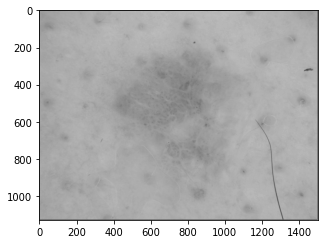

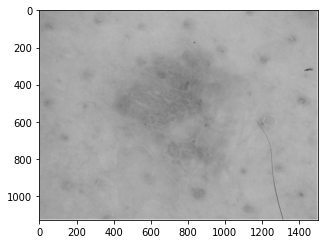

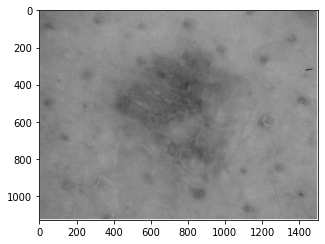

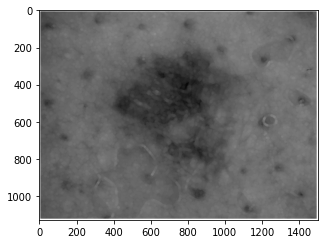

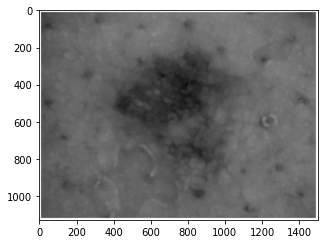

()

In [ ]:
img = skio.imread("nevus/ISIC_0000024.jpg")
sequential_filter(img,5)

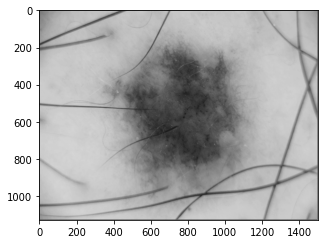

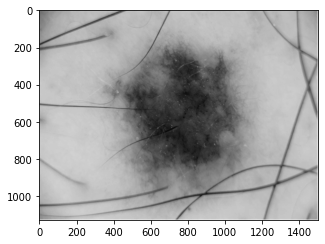

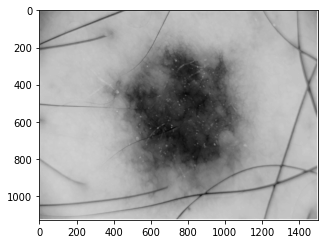

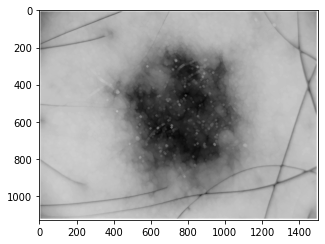

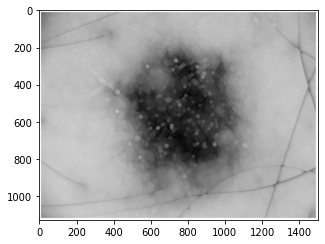

()

In [ ]:
img = skio.imread("nevus/ISIC_0000042.jpg")
sequential_filter(img,5)

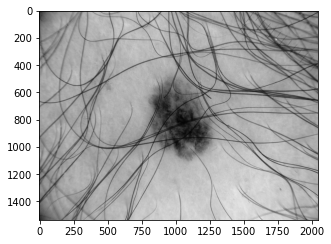

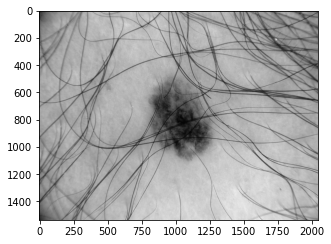

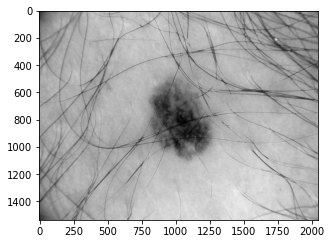

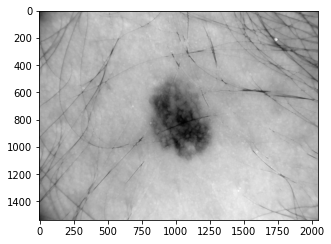

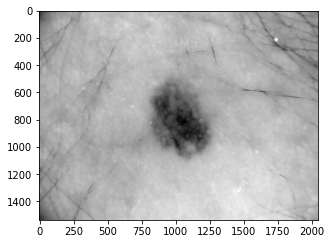

()

In [ ]:
img = skio.imread("nevus/ISIC_0000095.jpg")
sequential_filter(img,5)

filter_method

## Lowpass filter

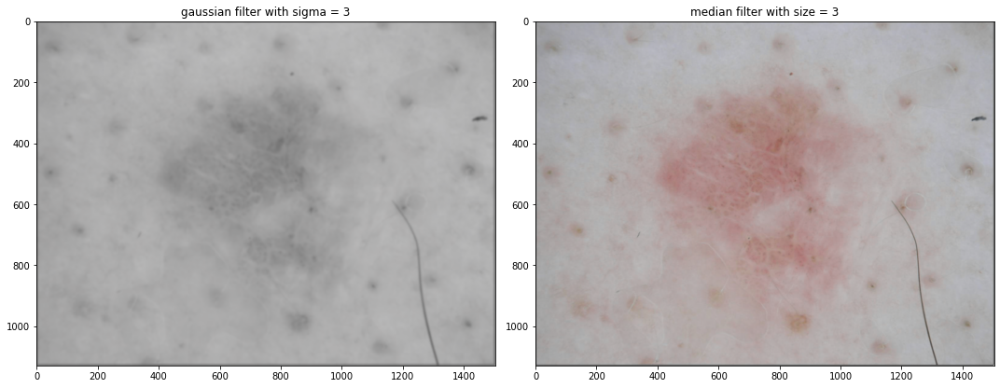

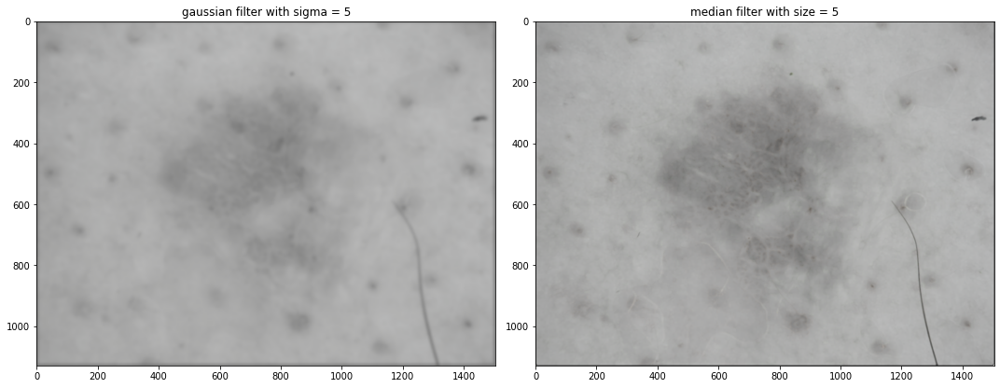

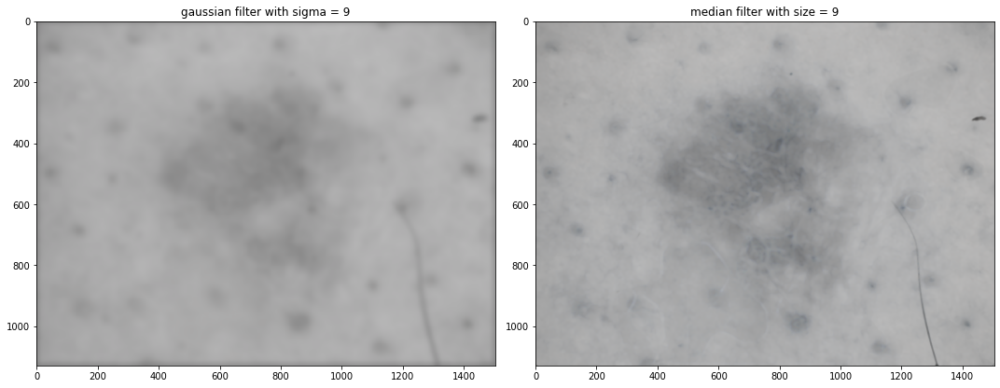

In [ ]:
img = skio.imread("nevus/ISIC_0000024.jpg")
filter_method(img)


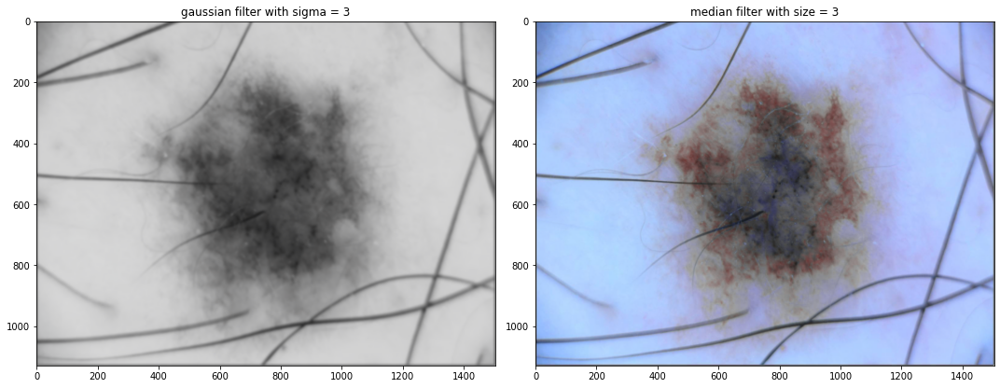

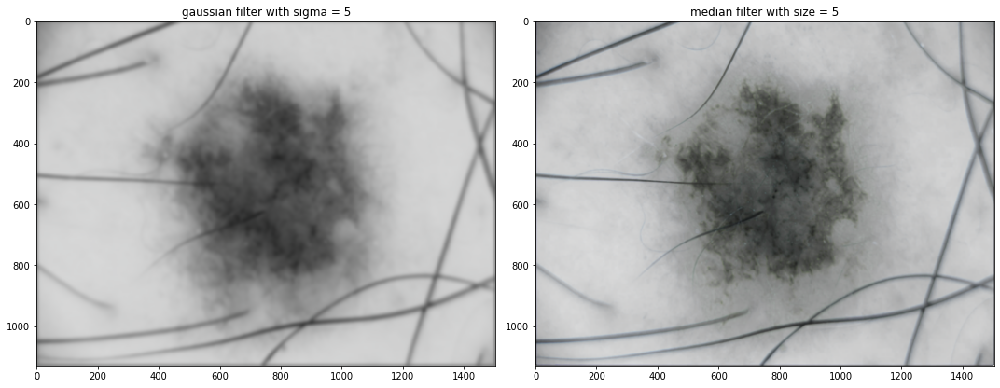

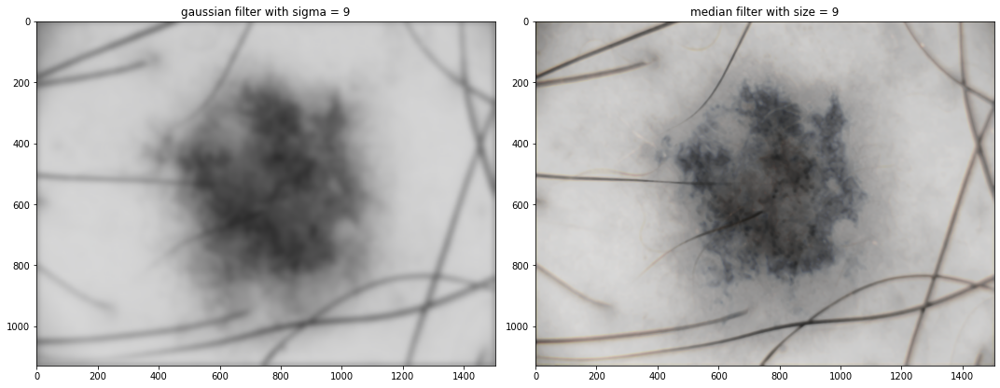

In [ ]:
img = skio.imread("nevus/ISIC_0000042.jpg")
filter_method(img)

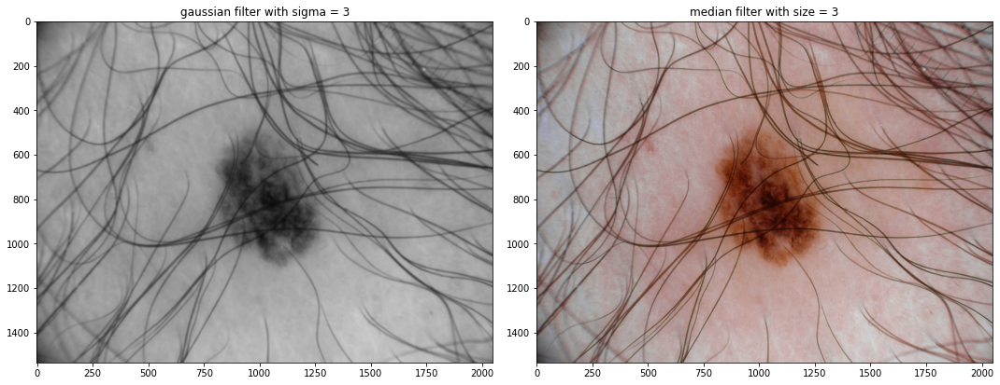

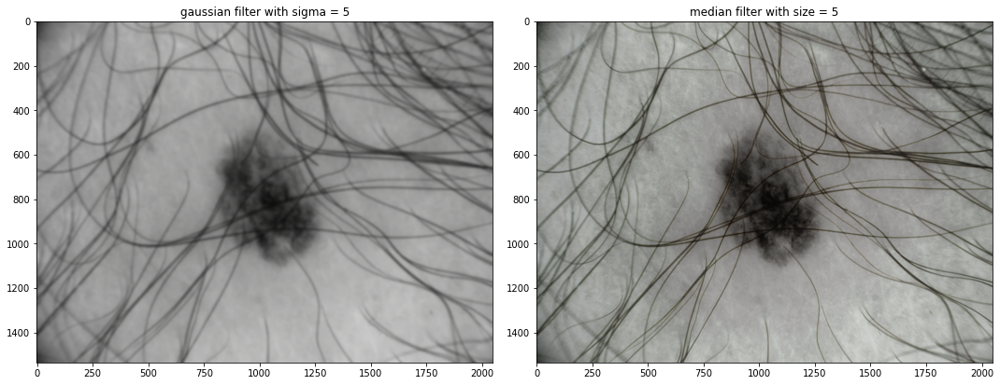

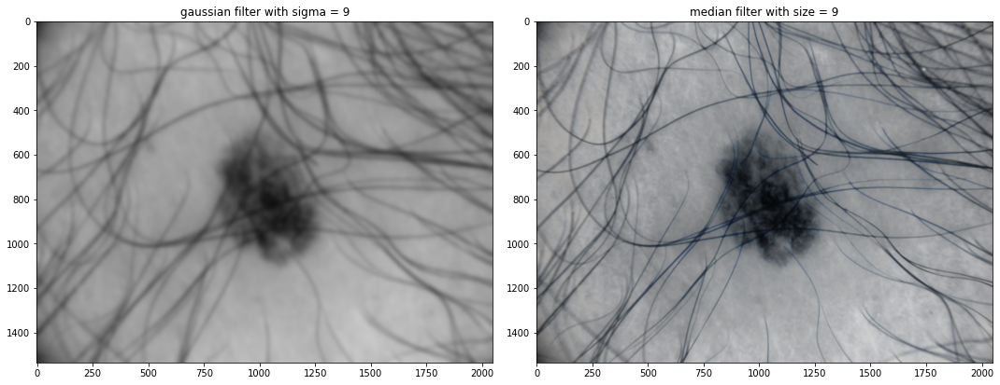

In [ ]:
img = skio.imread("nevus/ISIC_0000095.jpg")
filter_method(img)

## TopHat

In [ ]:
img0 = skio.imread("nevus/ISIC_0000000.jpg")
img0n = straight_forward_method(img0)
aimg = []
aimg.append(img0n)

FileNotFoundError: ignored

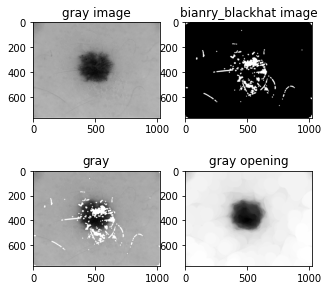

In [ ]:
img1 = skio.imread("nevus/ISIC_0000001.jpg")
img1n = straight_forward_method(img1)
aimg.append(img1n)

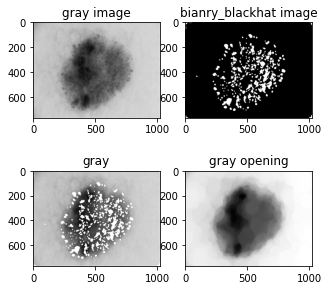

In [ ]:
img2 = skio.imread("nevus/ISIC_0000008.jpg")
img2n = straight_forward_method(img2)
aimg.append(img2n)

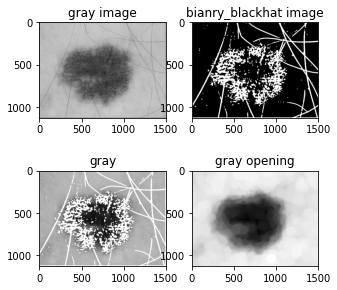

In [ ]:
img3 = skio.imread("nevus/ISIC_0000019.jpg")
img3n = straight_forward_method(img3)
aimg.append(img3n)

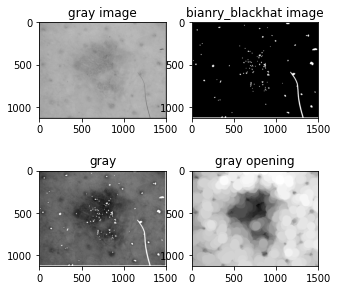

In [ ]:
img4 = skio.imread("nevus/ISIC_0000024.jpg")
img4n = straight_forward_method(img4)
aimg.append(img4n)

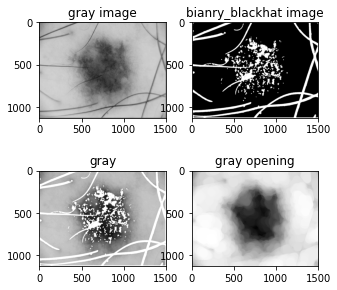

In [ ]:
img5 = skio.imread("nevus/ISIC_0000042.jpg")
img5n = straight_forward_method(img5)
aimg.append(img5n)

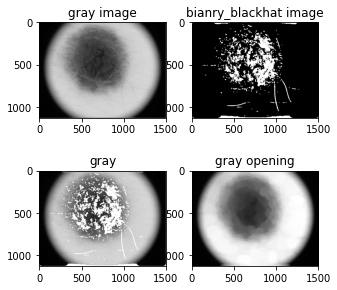

In [ ]:
img6 = skio.imread("nevus/ISIC_0000045.jpg")
img6n = straight_forward_method(img6)
aimg.append(img6n)

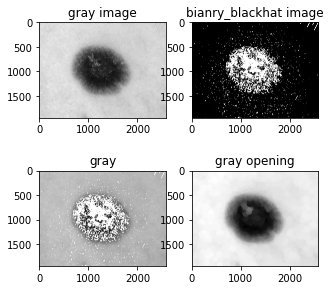

In [ ]:
img7 = skio.imread("nevus/ISIC_0000080.jpg")
img7n = straight_forward_method(img7)
aimg.append(img7n)

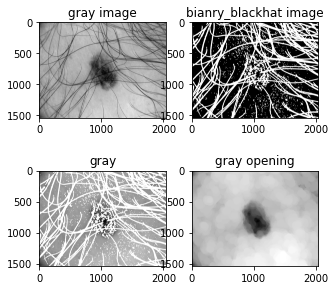

In [ ]:
img8 = skio.imread("nevus/ISIC_0000095.jpg")
img8n = straight_forward_method(img8)
aimg.append(img8n)

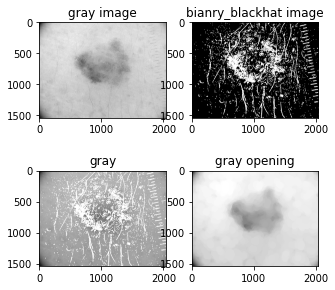

In [ ]:
img9 = skio.imread("nevus/ISIC_0000112.jpg")
img9n = straight_forward_method(img9)
aimg.append(img9n)

## Mean threshold

In [ ]:
oimg = [img0,img1,img2,img3,img4,img5,img6,img7,img8,img9]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  after removing the cwd from sys.path.


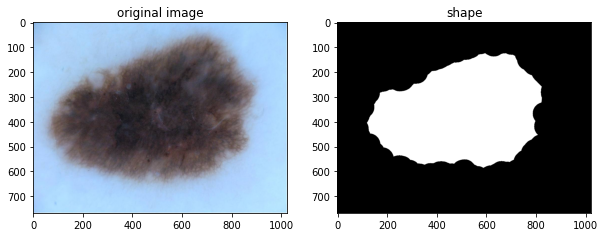

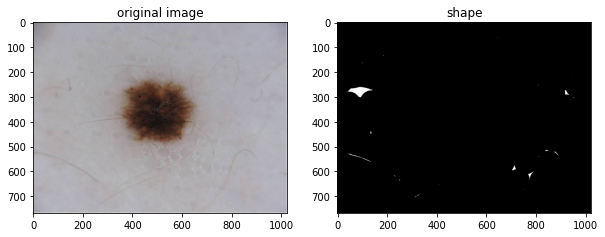

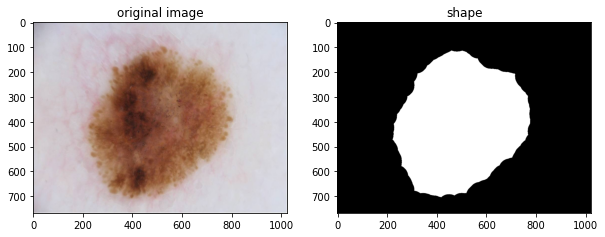

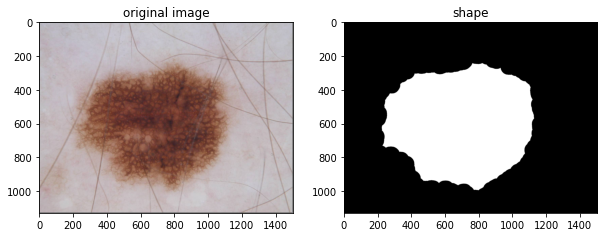

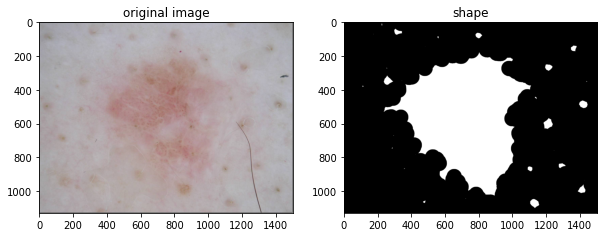

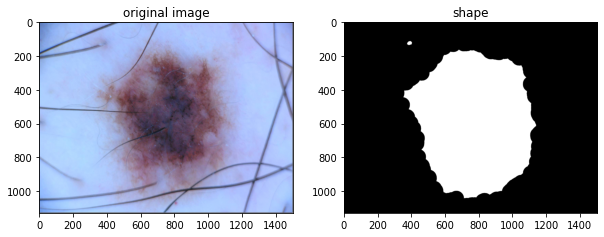

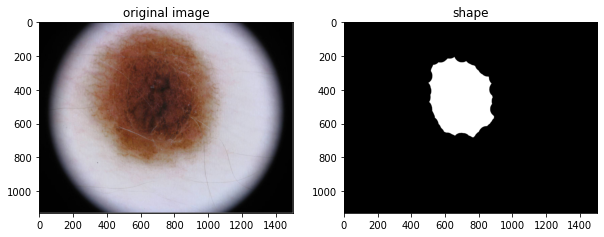

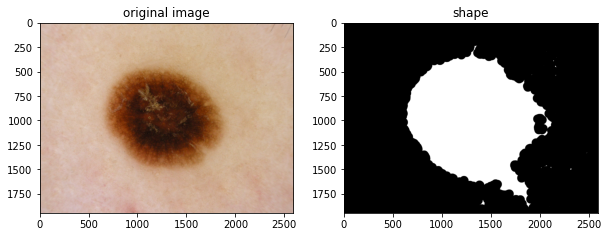

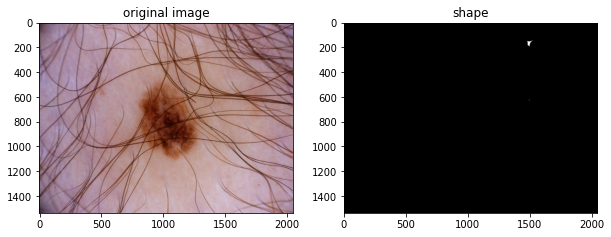

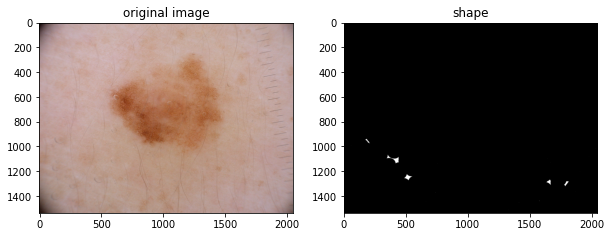

In [ ]:
i=0
while i < len(aimg):
  timg = tresholding(aimg[i])
  fig,ax = plt.subplots(1,2,figsize = (10,10))
  ax[0].imshow(oimg[i], cmap = "gray")
  ax[0].set_title("original image")
  ax[1].imshow(timg, cmap = "gray")
  ax[1].set_title("shape")
  plt.show()
  i = i+1

## Otsu's Thresold

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  after removing the cwd from sys.path.


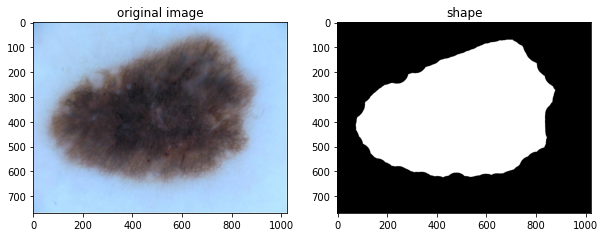

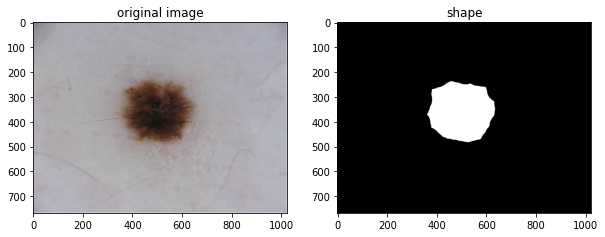

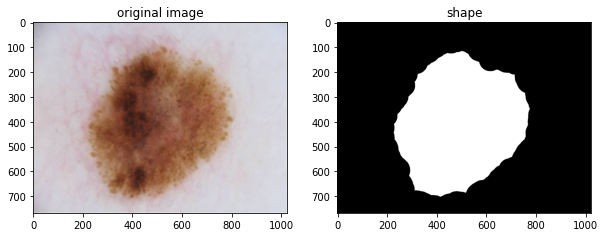

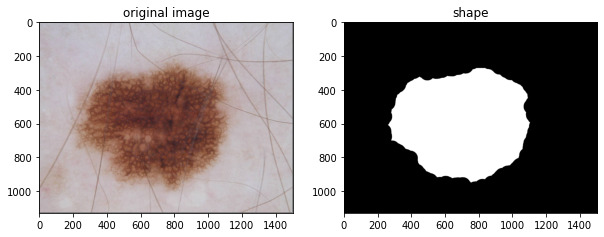

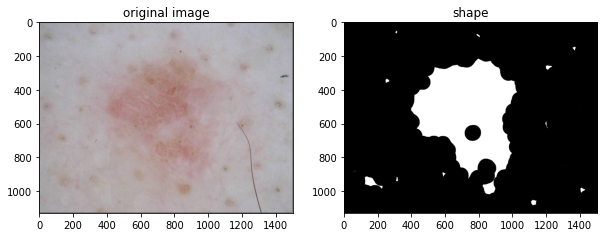

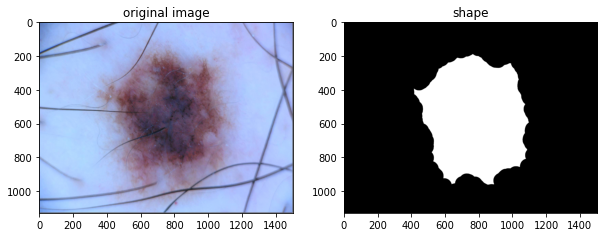

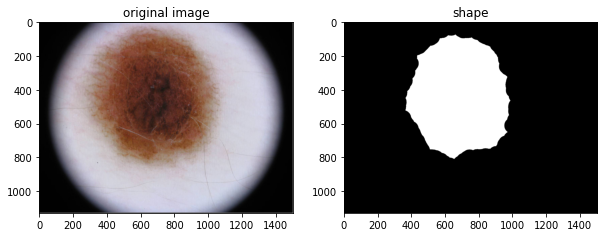

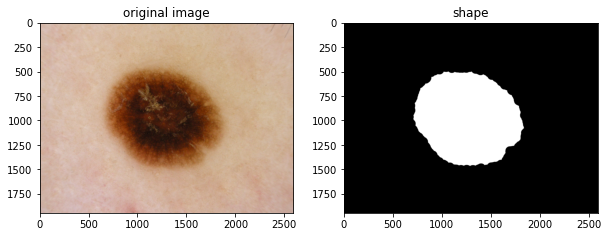

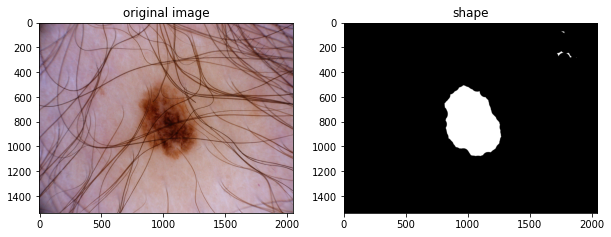

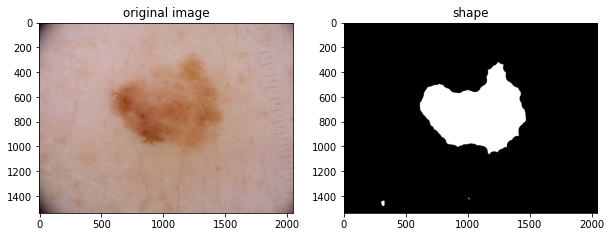

In [ ]:
i=0
while i < len(aimg):
  timg = otsu_threshold(aimg[i])
  fig,ax = plt.subplots(1,2,figsize = (10,10))
  ax[0].imshow(oimg[i], cmap = "gray")
  ax[0].set_title("original image")
  ax[1].imshow(timg, cmap = "gray")
  ax[1].set_title("shape")
  plt.show()
  i = i+1

## Kmeans

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  del sys.path[0]


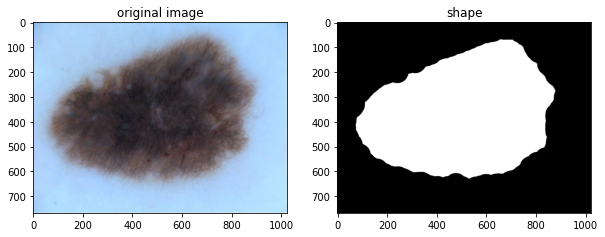

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  del sys.path[0]


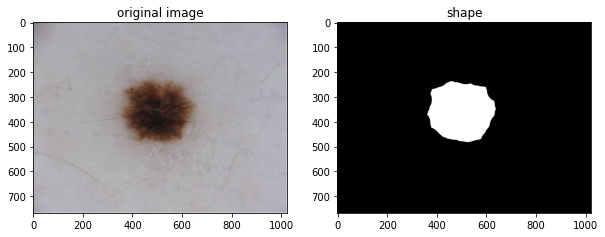

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  del sys.path[0]


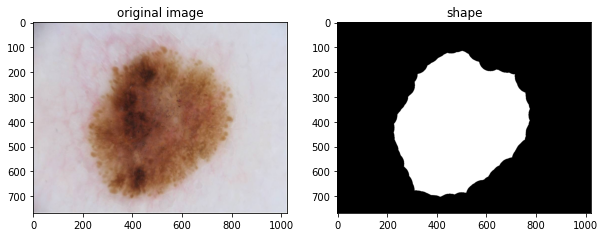

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  del sys.path[0]


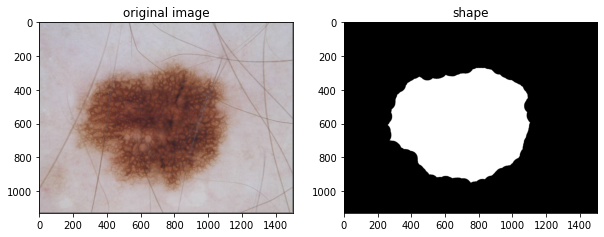

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  del sys.path[0]


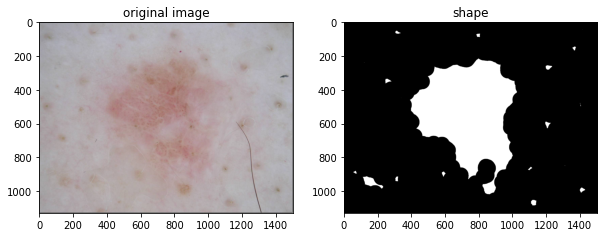

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  del sys.path[0]


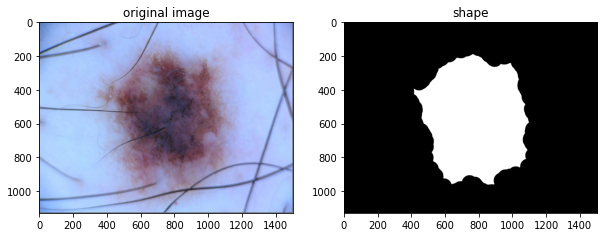

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  del sys.path[0]


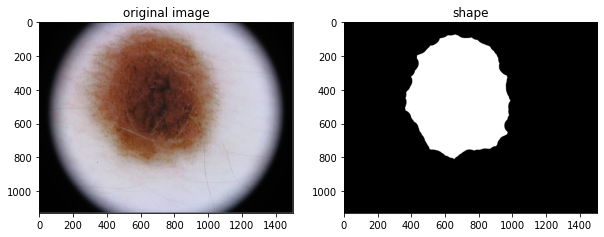

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  del sys.path[0]


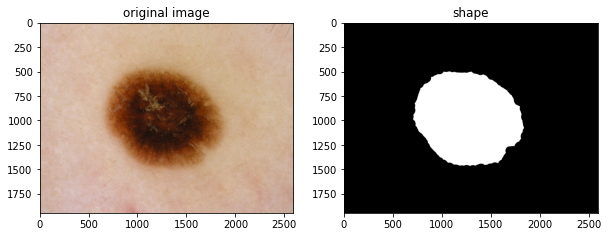

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  del sys.path[0]


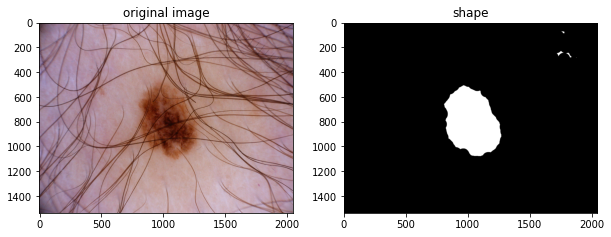

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  del sys.path[0]


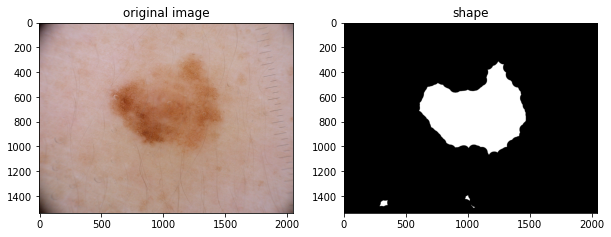

In [ ]:
i=0
labels_km = []
while i < len(aimg):
  timg, labels = skmeans(aimg[i])
  labels_km.append(labels)
  fig,ax = plt.subplots(1,2,figsize = (10,10))
  ax[0].imshow(oimg[i], cmap = "gray")
  ax[0].set_title("original image")
  ax[1].imshow(timg, cmap = "gray")
  ax[1].set_title("shape")
  plt.show()
  i = i+1


In [ ]:
img_t1 = skio.imread("nevus/ISIC_0000024_Segmentation.png")
img_t2 = skio.imread("nevus/ISIC_0000095_Segmentation.png")
true_array1 = img_t1.reshape(img_t1.shape[0]*img_t1.shape[1],1)
true_array2 = img_t2.reshape(img_t2.shape[0]*img_t2.shape[1],1)

performance(true_array1/255,labels_km[4],"kmeans's Thresold's worest result")
performance(true_array2/255,labels_km[8],"kmeans's Thresold's best result")

kmeans's Thresold's worest result
accuracy: 0.8159775879614798
confusion matrix:
[[1103293   30766]
 [ 281707  282250]]
kmeans's Thresold's best result
accuracy: 0.9634027481079102
confusion matrix:
[[2846219   55386]
 [  59739  184384]]


## Bayesian Class

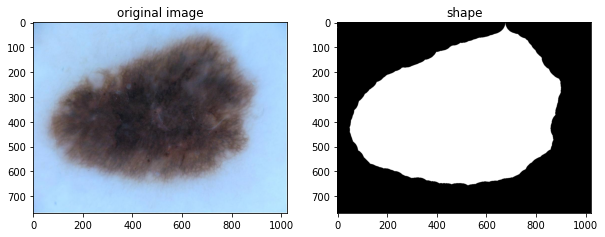

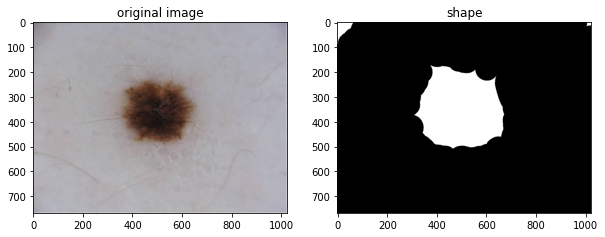

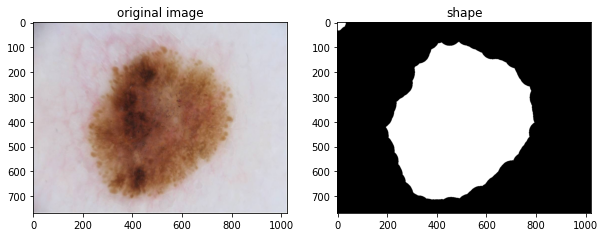

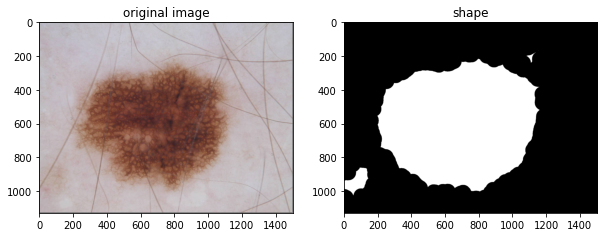

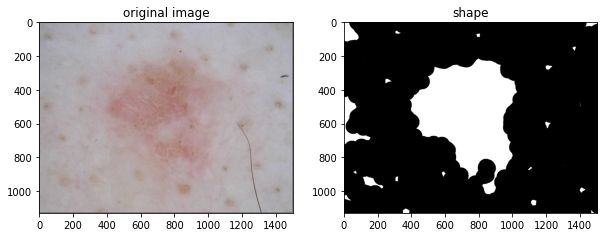

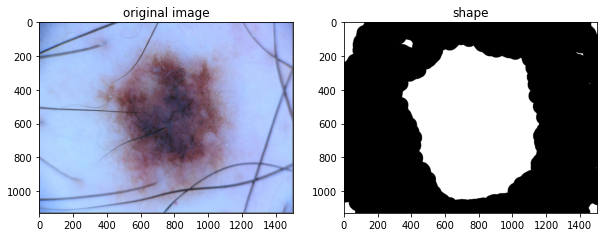

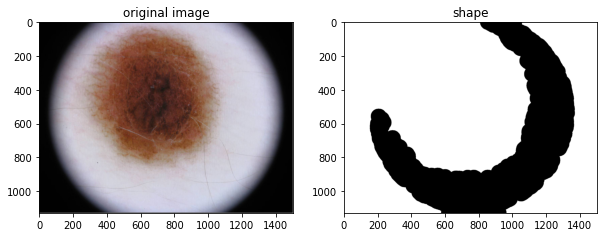

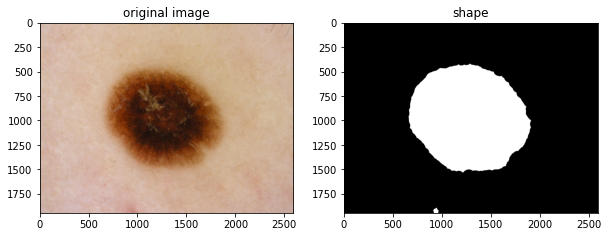

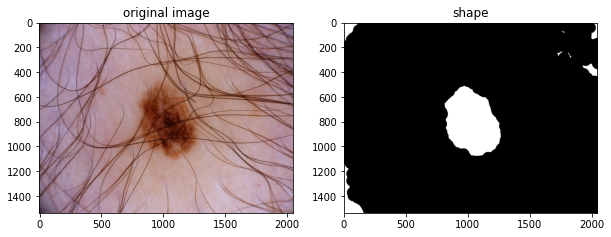

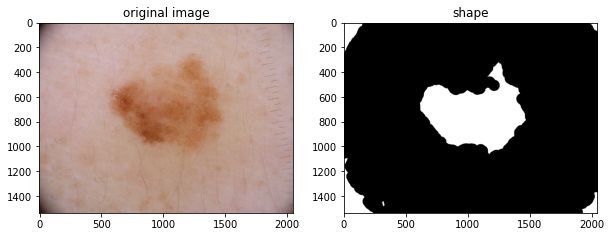

In [ ]:
i=0
labels_gmm=[]
while i < len(aimg):
  timg, labels = baysian_classification(aimg[i])
  fig,ax = plt.subplots(1,2,figsize = (10,10))
  labels_gmm.append(labels)
  ax[0].imshow(oimg[i], cmap = "gray")
  ax[0].set_title("original image")
  ax[1].imshow(timg, cmap = "gray")
  ax[1].set_title("shape")
  plt.show()
  i = i+1


In [ ]:
img_t1 = skio.imread("nevus/ISIC_0000024_Segmentation.png")
img_t2 = skio.imread("nevus/ISIC_0000095_Segmentation.png")
true_array1 = img_t1.reshape(img_t1.shape[0]*img_t1.shape[1],1)
true_array2 = img_t2.reshape(img_t2.shape[0]*img_t2.shape[1],1)

performance(true_array1/255,1-labels_gmm[4],"Baysian classification's worest result")
performance(true_array2/255,1-labels_gmm[8],"Baysian classification's best result")

Baysian classification's worest result
accuracy: 0.8159775879614798
confusion matrix:
[[1103293   30766]
 [ 281707  282250]]
Baysian classification's best result
accuracy: 0.9661973317464193
confusion matrix:
[[2860330   41275]
 [  65059  179064]]


In [ ]:
k=3
segmented = water_shed(modified_grad, morpho_grad, k)
Comparison(segmented, ground_truth)